# Utils

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os

import numpy as np
import pandas as pd

import sklearn
import sklearn.metrics

from statsmodels.formula.api import ols

import networkx as nx

from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns

from eval import poincare_distance
from data import load_data
from network import generate_synthetic_euclidean_network, generate_synthetic_hyperbolic_network, get_scale_free_soft_treshold_power
from dimred import fit_PCA, fit_UMAP, fit_HUMAP, fit_PMAP

In [2]:
def plot_networks(networks, node_color = "#4c72b0", edge_stregth = 0.5, node_size_base = 1, node_size_degree_increment = 0.25,
                  save_name = None, n_cols = 1, n_rows = 1, d1 = 5.5, d2 = 5.0, fontsize = 12):

    plt.rcParams["figure.dpi"] = 150

    _, _ = plt.subplots(n_rows, n_cols, figsize=(d1*n_cols, d2*n_rows))
    for i, (name, net) in enumerate(networks.items()):
        plt.subplot(n_rows, n_cols, i+1)
        plt.axis('off')
        G, coordinates = net
        nodes = nx.draw_networkx_nodes(G, coordinates, 
                               node_size=[node_size_base + node_size_degree_increment* d for (node, d) in G.degree()], 
                               node_color=node_color, cmap = "viridis",
                               edgecolors="black", linewidths = node_size_base*0.5, alpha = 1.00)
        nx.draw_networkx_edges(G, coordinates, width=edge_stregth, alpha=edge_stregth)
        plt.title(name, fontsize=fontsize)

    if len(networks) < n_rows * n_cols:
        for i in range(len(networks), n_rows * n_cols):
            ax = plt.subplot(n_rows, n_cols, i+1)
            ax.axis('off')
            ax.axis('equal')

    if type(node_color) != str:
        plt.colorbar(nodes, cax=inset_axes(plt.gca(), width="5%", height="50%", loc=1), orientation='vertical')

    plt.tight_layout()

    if save_name:
        plt.savefig(save_name, bbox_inches = 'tight')

    plt.show()

In [3]:
def plot_degree_distribution(graphs, fontsize=12, save_name = None, title = None,):

    plt.rcParams["figure.dpi"] = 150
    sns.set(style="whitegrid")

    plt.figure(figsize=(12, 5))

    df = None
    for name, G in graphs.items():
        degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
        degrees, degree_numbers = np.unique(degree_sequence, return_counts=True)
        df_degree = pd.DataFrame(np.stack([degrees, degree_numbers / degree_numbers.sum()]).T, columns = ["Degree", "Probability"])
        df_degree["Graph"] = name
        if df is None:
            df = df_degree
        else:
            df = pd.concat([df, df_degree])

    sns.scatterplot(df, x = "Degree", y = "Probability", hue = "Graph", s = 20)

    if title:
        plt.title(title, fontsize=fontsize+4)
    plt.xlabel('Degree (log scale)', fontsize=fontsize+2)
    plt.xticks(fontsize=fontsize)
    plt.xscale("log")
    plt.ylabel('Probability (log scale)', fontsize=fontsize+2)
    plt.yticks(fontsize=fontsize)
    plt.yscale("log")
    plt.legend(loc='lower left', fontsize=fontsize+2)
    
    if save_name:
        plt.savefig(save_name, bbox_inches = 'tight')

    plt.show()

In [4]:
def plot_scale_independence(similarity_matrices, fontsize=12, save_name = None, title = None, powers = np.arange(1, 11), RsquaredCut=0.9, MeanCut=100, nBreaks=10):
    
    df = None
    for name, matrix in similarity_matrices.items():
        df_scale_free_soft_treshold, _ = get_scale_free_soft_treshold_power(matrix, powers, RsquaredCut, MeanCut, nBreaks)
        df_scale_free_soft_treshold["Similarity matrix"] = name
        if df is None:
            df = df_scale_free_soft_treshold
        else:
            df = pd.concat([df, df_scale_free_soft_treshold])

    plt.rcParams["figure.dpi"] = 150
    sns.set(style="whitegrid")
    plt.figure(figsize=(12, 5))

    sns.scatterplot(df, x = "Power", y = "signed R^2", hue = "Similarity matrix", s = 40)
    plt.axhline(0.9, color='r')
    plt.xticks(df["Power"], fontsize=fontsize)
    plt.xlabel("Soft Threshold (Power)", fontsize=fontsize+2)
    plt.ylabel("Scale Free Model Fit: signed R^2", fontsize=fontsize+2)
    plt.yticks(fontsize=fontsize)
    if title:
        plt.title(title, fontsize=fontsize+4)
    plt.legend(fontsize=fontsize+2)

    if save_name:
        plt.savefig(save_name, bbox_inches = 'tight')

    plt.show()

In [ ]:
def poincare_translation(v, x):
    """
        Poincaré translation operation: Computes the translation of x with -v (such that v is shifted to the center).
        Code is adapted from Poincaré Maps:
            https://github.com/facebookresearch/PoincareMaps/blob/main/poincare_maps.py
            Creative Commons Attribution-NonCommercial 4.0 International Public License
    """
    xsq = (x ** 2).sum(axis=1)
    vsq = (v ** 2).sum()
    xv = (x * v).sum(axis=1)
    a = np.matmul((xsq + 2 * xv + 1).reshape(-1, 1),
                  v.reshape(1, -1)) + (1 - vsq) * x
    b = xsq * vsq + 2 * xv + 1
    return np.dot(np.diag(1. / b), a)

In [12]:
def plot_norm_to_degree(embedding_dict, weighted_degree, degree, method, dimensions, neighbors, d1 = 4.0, d2 = 4.0, fontsize = 12, translate = False, title = None, save_name = None,):

    plt.rcParams["figure.dpi"] = 150

    n_cols = len(dimensions)
    n_rows = len(neighbors)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(d1*n_cols, d2*n_rows), sharey=True)

    if translate:
        max_idx = np.argmax(weighted_degree)
        weighted_degree = np.delete(weighted_degree, max_idx)
        degree = np.delete(degree, max_idx)
    
    for i, n in enumerate(neighbors):
        for j, d in enumerate(dimensions):
            embeddings = embedding_dict[method][d][n]
            if translate:
                center = embeddings[max_idx]
                embeddings = np.delete(embeddings, max_idx, axis = 0)
                if ("PMAP" in method) or ("HUMAP" in method):
                    embeddings = poincare_translation(-center, embeddings)
                else:
                    embeddings = embeddings - center

            if ("PMAP" in method) or ("HUMAP" in method):
                norms = poincare_distance(np.concatenate([np.zeros_like(embeddings[0:1]), embeddings], axis=0))[0, 1:]
            else:  
                norms = sklearn.metrics.pairwise.euclidean_distances(np.concatenate([np.zeros_like(embeddings[0:1]), embeddings], axis=0))[0, 1:]

            model = ols(formula='norm ~ weighted_degree', data=pd.DataFrame({'norm': norms, 'weighted_degree': weighted_degree})).fit()

            signed_R = np.sign(model.params.values[1]) * model.rsquared

            plt.subplot(n_rows, n_cols, i*n_cols+j+1)
            ax = plt.gca()

            plt.scatter(x = norms, y = weighted_degree, s = 4, alpha = 0.8, c = degree, cmap = "viridis")

            ax.spines[['top', 'right']].set_visible(False)

            plt.xticks(fontsize=fontsize-2)
            plt.yticks(fontsize=fontsize-2)
  
            plt.title("Signed R^2: " + str(round(signed_R, 4)), fontsize=fontsize+4)

            if i == n_rows - 1:
                ax.set_xlabel(str(d) + "D embedding norm", fontsize=fontsize+2)
            else:
                ax.set_xlabel("")

            if (j == 0) and (n_rows != 1):
                ax.set_ylabel(str(n) + " neighbors\nWeighted degree", fontsize=fontsize+2)
            elif (j == 0):
                ax.set_ylabel("Weighted degree", fontsize=fontsize+2)
            else:
                ax.set_ylabel("")

            if (i == n_rows - 1) and (j == n_cols - 1):
                plt.colorbar(cax=inset_axes(ax, width="5%", height="50%", loc=1), orientation='vertical')

    if title:
        fig.suptitle(title, fontsize=fontsize+8)

    fig.tight_layout()

    if save_name:
        plt.savefig(save_name, bbox_inches = 'tight')

    plt.show()

# Experiments

In [11]:
data = load_data("data/L1000FWD/", "data/SigComLINCS/")

## Scale-free nature

### Synthetic networks

In [53]:
N = 2000
average_degree = 7
R = 2 * np.log(N * 8 / (np.pi * average_degree))
r = R * np.sqrt(average_degree/N)

In [54]:
G_euclidean, coordinates_euclidean, distances_euclidean, adjacency_euclidean = generate_synthetic_euclidean_network(N = N, R = R, r = r)
distances_euclidean = distances_euclidean / (R*2)
similarities_euclidean = 1 - distances_euclidean
np.fill_diagonal(similarities_euclidean, 1)

print("Average degree: " + str(adjacency_euclidean.sum(axis=1).mean()))
print("Largest component ratio: " + str(len(sorted(nx.connected_components(G_euclidean), key=len, reverse=True)[0]) / N))

Average degree: 6.773
Largest component ratio: 0.9665


In [55]:
G_hyperbolic, coordinates_hyperbolic, distances_hyperbolic, adjacency_hyperbolic = generate_synthetic_hyperbolic_network(N = N, R = R, r = R)
distances_hyperbolic = distances_hyperbolic / (R*2)
similarities_hyperbolic = 1 - distances_hyperbolic
np.fill_diagonal(similarities_hyperbolic, 1)

print("Average degree: " + str(adjacency_hyperbolic.sum(axis=1).mean()))
print("Largest component ratio: " + str(len(sorted(nx.connected_components(G_hyperbolic), key=len, reverse=True)[0]) / N))

Average degree: 6.503
Largest component ratio: 0.8045


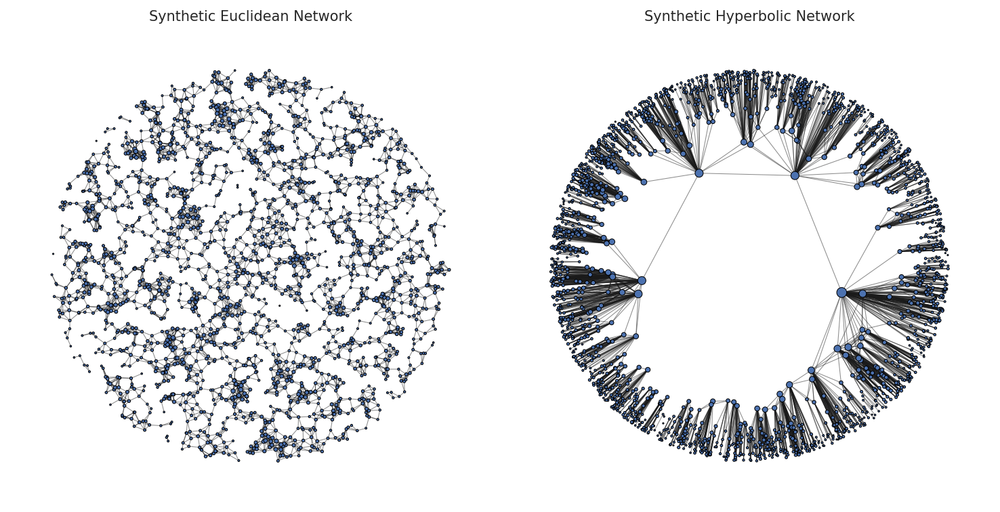

In [216]:
plot_networks({"Synthetic Euclidean Network": (G_euclidean, coordinates_euclidean), 
               "Synthetic Hyperbolic Network": (G_hyperbolic, coordinates_hyperbolic),},
               edge_stregth = 0.5, node_size_base = 1, node_size_degree_increment = 0.5,
               n_cols = 2, n_rows = 1, d1 = 5, d2 = 5.2, fontsize = 10,
               save_name="synthetic_networks.png")

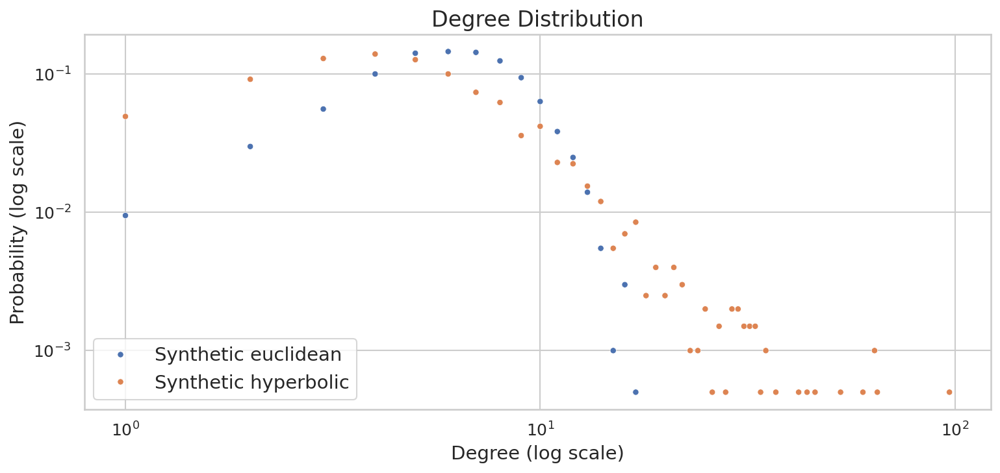

In [57]:
plot_degree_distribution({"Synthetic euclidean": G_euclidean, "Synthetic hyperbolic": G_hyperbolic,})

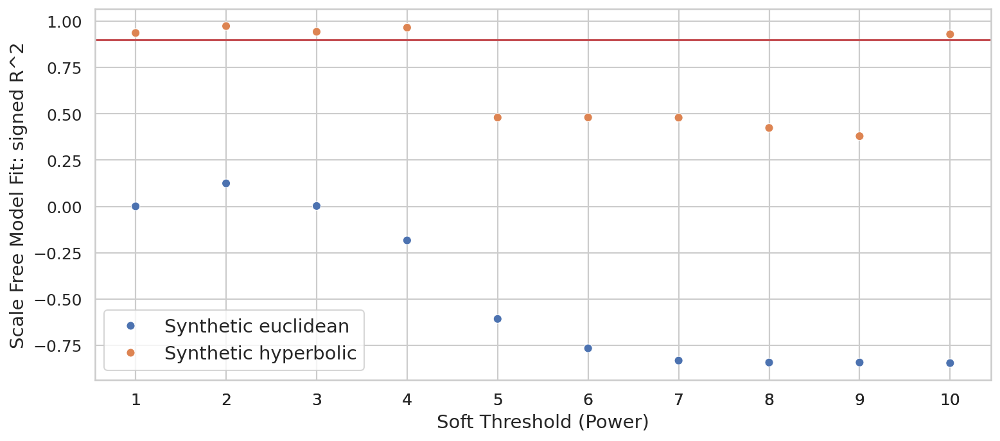

In [58]:
plot_scale_independence({"Synthetic euclidean": similarities_euclidean, "Synthetic hyperbolic": similarities_hyperbolic,}, nBreaks=10)

### LINCS

#### L1000 landmark

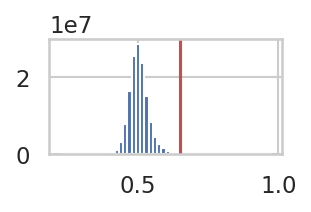

Average degree: 74.454534662868
Largest component ratio: 0.9929368471035138
Subset average degree: 9.193
Subset largest component ratio: 0.6005


In [59]:
dataset_name = "L1000FWD"
data_subset_name = "landmark"

similarities = sklearn.metrics.pairwise.cosine_similarity(data[dataset_name][data_subset_name]["signatures"])
similarities = (1 + similarities) / 2
np.fill_diagonal(similarities,1)

r = 0.65
plt.figure(figsize=(2,1))
plt.hist(similarities[np.where(1-np.tri(similarities.shape[0])==1)], bins = 50)
plt.axvline(x = r, c = "r")
plt.show()
adjacency_matrix = (similarities > r).astype(int) - np.eye(similarities.shape[0])
rows, cols = np.where(adjacency_matrix == 1)
edges = zip(rows.tolist(), cols.tolist())
G = nx.empty_graph(similarities.shape[0])
G.add_edges_from(edges)

print("Average degree: " + str(np.array([d for n, d in G.degree]).mean()))
print("Largest component ratio: " + str(len(sorted(nx.connected_components(G), key=len, reverse=True)[0]) / len(G)))

subset_similarities = similarities[:N,:N]
subset_adjacency_matrix = adjacency_matrix[:N,:N]
subset_G = G.subgraph(np.arange(N))

print("Subset average degree: " + str(np.array([d for n, d in subset_G.degree]).mean()))
print("Subset largest component ratio: " + str(len(sorted(nx.connected_components(subset_G), key=len, reverse=True)[0]) / len(subset_G)))

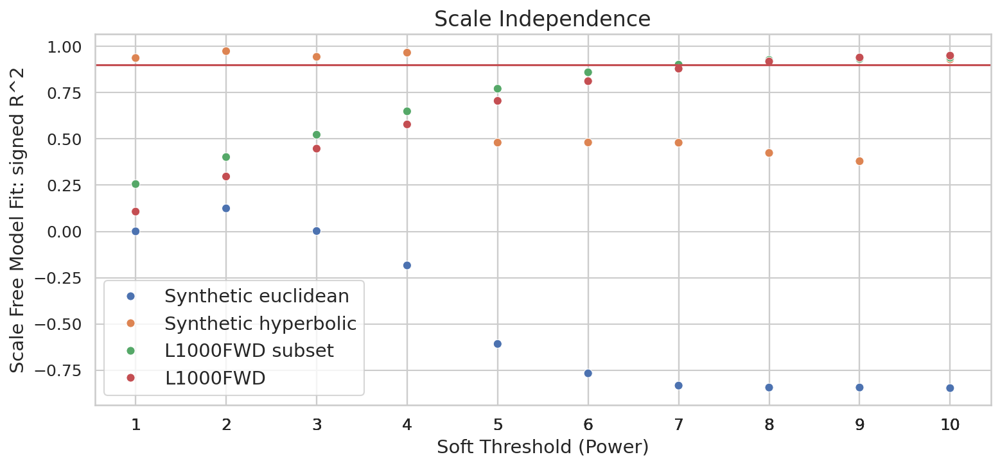

In [60]:
plot_scale_independence({"Synthetic euclidean": similarities_euclidean,"Synthetic hyperbolic": similarities_hyperbolic, 
                         "L1000FWD subset": subset_similarities, "L1000FWD": similarities,},
                        title = 'Scale Independence',
                        save_name = dataset_name + "_" + data_subset_name + "_scale_independence_vs_synthetic.png")

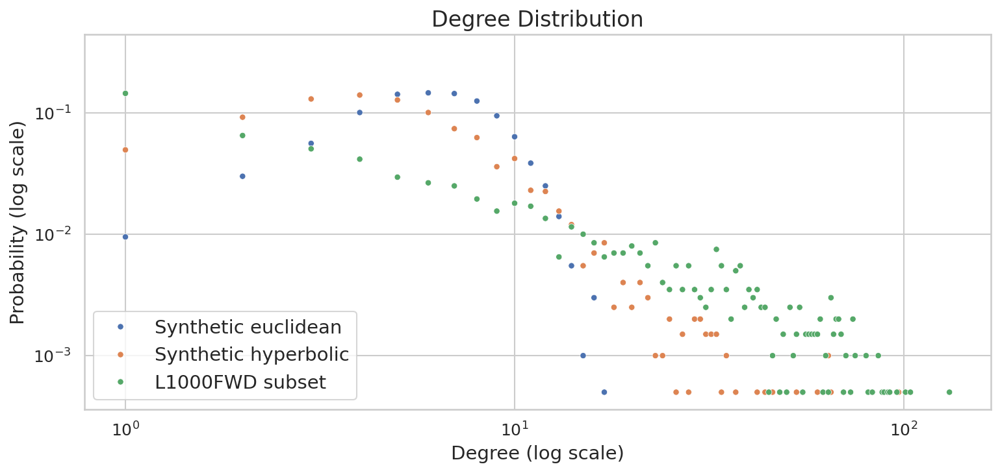

In [66]:
plot_degree_distribution({"Synthetic euclidean": G_euclidean, "Synthetic hyperbolic": G_hyperbolic, "L1000FWD subset": subset_G},
                         title = 'Degree Distribution',
                         save_name = dataset_name + "_" + data_subset_name + "_degree_distribution_vs_synthetic.png")

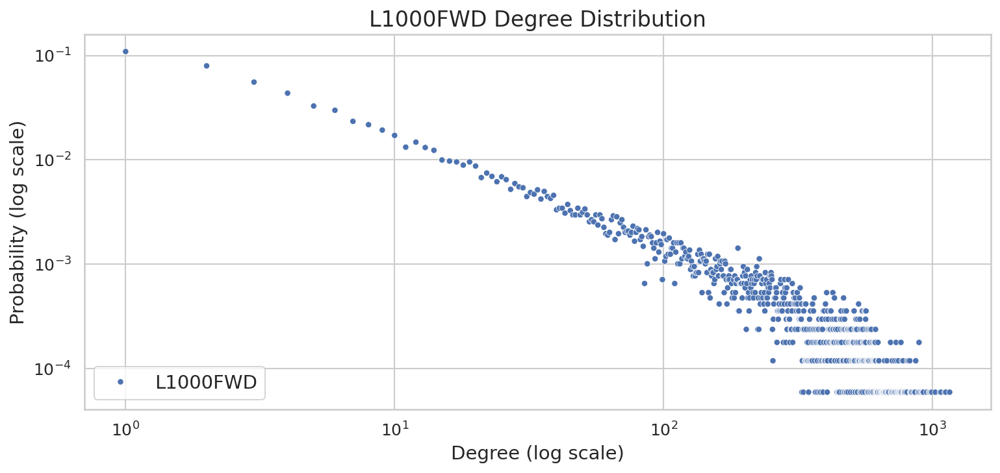

In [67]:
plot_degree_distribution({"L1000FWD": G},
                         title = 'L1000FWD Degree Distribution',
                         save_name = dataset_name + "_" + data_subset_name + "_degree_distribution.png")

#### Distance metrics

In [ ]:
similarities_over_metrics = {}

dissimilarities = sklearn.metrics.pairwise.euclidean_distances(data[dataset_name][data_subset_name]["signatures"])
similarities =  1 - (dissimilarities / dissimilarities.max())
np.fill_diagonal(similarities,1)
similarities_over_metrics["euclidean"] = similarities

similarities = sklearn.metrics.pairwise.cosine_similarity(data[dataset_name][data_subset_name]["signatures"])
similarities = (1 + similarities) / 2
np.fill_diagonal(similarities,1)
similarities_over_metrics["cosine"] = similarities

dissimilarities = sklearn.metrics.pairwise_distances(data[dataset_name][data_subset_name]["signatures"], metric="canberra")
similarities =  1 - (dissimilarities / dissimilarities.max())
np.fill_diagonal(similarities,1)
similarities_over_metrics["canberra"] = similarities

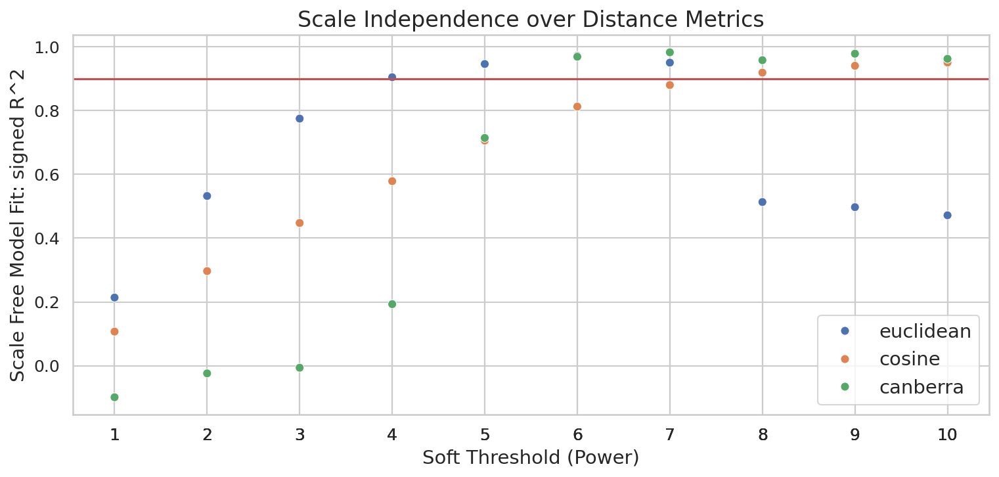

In [69]:
plot_scale_independence(similarities_over_metrics, powers = np.arange(1, 11), title = 'Scale Independence over Distance Metrics',
                        save_name="L1000FWD_landmark_scale_independence_over_metrics.png")

#### Datasets

In [70]:
similarities_over_datasets = {}
for dataset_name, data_subset_name in [("L1000FWD", "landmark"), ("L1000FWD", "full"),
                                       ("SigComLINCS", "A375"), ("SigComLINCS", "NPC"), ("SigComLINCS", "NEU"), ("SigComLINCS", "HELA")]:
    similarities = sklearn.metrics.pairwise.cosine_similarity(data[dataset_name][data_subset_name]["signatures"])
    similarities = (1 + similarities) / 2
    np.fill_diagonal(similarities,1)
    similarities_over_datasets[dataset_name + " " + data_subset_name] = similarities

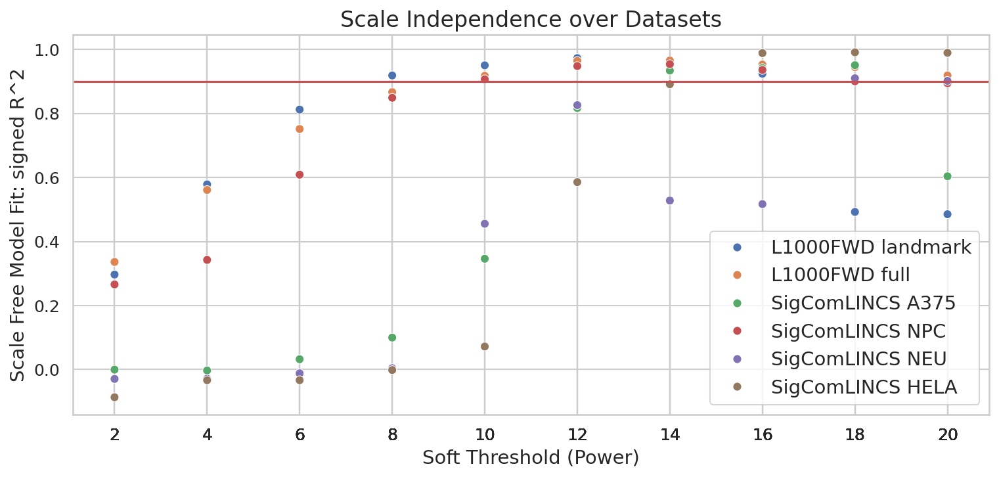

In [71]:
plot_scale_independence(similarities_over_datasets, powers = np.arange(2, 21, 2), title = 'Scale Independence over Datasets',
                        save_name="scale_independence_over_datasets.png")

## Dimensionality reduction and scale-free nature

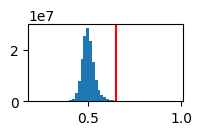

Average degree: 74.454534662868
Largest component ratio: 0.9929368471035138
Subset average degree: 9.193
Subset largest component ratio: 0.6005


In [10]:
dataset_name = "L1000FWD"
data_subset_name = "landmark"

N = 2000

similarities = sklearn.metrics.pairwise.cosine_similarity(data[dataset_name][data_subset_name]["signatures"])
similarities = (1 + similarities) / 2
np.fill_diagonal(similarities,1)

r = 0.65
plt.figure(figsize=(2,1))
plt.hist(similarities[np.where(1-np.tri(similarities.shape[0])==1)], bins = 50)
plt.axvline(x = r, c = "r")
plt.show()
adjacency_matrix = (similarities > r).astype(int) - np.eye(similarities.shape[0])
rows, cols = np.where(adjacency_matrix == 1)
edges = zip(rows.tolist(), cols.tolist())
G = nx.empty_graph(similarities.shape[0])
G.add_edges_from(edges)

print("Average degree: " + str(np.array([d for n, d in G.degree]).mean()))
print("Largest component ratio: " + str(len(sorted(nx.connected_components(G), key=len, reverse=True)[0]) / len(G)))

subset_similarities = similarities[:N,:N]
subset_adjacency_matrix = adjacency_matrix[:N,:N]
subset_G = G.subgraph(np.arange(N))

print("Subset average degree: " + str(np.array([d for n, d in subset_G.degree]).mean()))
print("Subset largest component ratio: " + str(len(sorted(nx.connected_components(subset_G), key=len, reverse=True)[0]) / len(subset_G)))

weighted_degree = (similarities**7).sum(axis=0) - 1
degree = adjacency_matrix.sum(axis=0)

subset_weighted_degree = (subset_similarities**7).sum(axis=0) - 1
subset_degree = subset_adjacency_matrix.sum(axis=0)

In [ ]:
data[dataset_name][data_subset_name]["embeddings"] = {}

data[dataset_name][data_subset_name]["embeddings"]["FWD"] = {}
data[dataset_name][data_subset_name]["embeddings"]["FWD"][2] = {}
data[dataset_name][data_subset_name]["embeddings"]["FWD"][2][0] = data[dataset_name][data_subset_name]["metadata"][["x", "y"]].values

for method_function in [fit_PCA, fit_UMAP, fit_HUMAP, fit_PMAP]:
    method = method_function.__name__.split("_")[1]
    data[dataset_name][data_subset_name]["embeddings"][method] = {}
    for dimension in [2, 4, 8, 16, 64]:
        data[dataset_name][data_subset_name]["embeddings"][method][dimension] = {}
        if method == "PCA":
            file_name = "results/" + dataset_name + "/" + data_subset_name + "_" +  str(dimension) + "D_PCA.npy"
            if os.path.isfile(file_name):
                data[dataset_name][data_subset_name]["embeddings"][method][dimension][0] = np.load(file_name)
            else:
                embeddings = fit_PCA(data[dataset_name][data_subset_name]["signatures"], dimension)
                np.save(file_name, embeddings)
                data[dataset_name][data_subset_name]["embeddings"][method][dimension][0] = embeddings
        else:
            for neighbors in [5, 50, 250]:
                file_name = "results/" + dataset_name + "/" + data_subset_name + "_" +  str(dimension) + "D_" + method + "_" + str(neighbors) + ".npy"
                if os.path.isfile(file_name):
                    data[dataset_name][data_subset_name]["embeddings"][method][dimension][neighbors] = np.load(file_name)
                else:
                    embeddings = method_function(data[dataset_name][data_subset_name]["signatures"], dimension, neighbors)
                    np.save(file_name, embeddings)
                    data[dataset_name][data_subset_name]["embeddings"][method][dimension][neighbors] = embeddings


data[dataset_name][data_subset_name]["subset_embeddings"] = {}
for method_function in [fit_PCA, fit_UMAP, fit_HUMAP, fit_PMAP]:
    method = method_function.__name__.split("_")[1]
    data[dataset_name][data_subset_name]["subset_embeddings"][method] = {}
    for dimension in [2, 4, 8, 16, 64]:
        data[dataset_name][data_subset_name]["subset_embeddings"][method][dimension] = {}
        if method == "PCA":
            embeddings = fit_PCA(data[dataset_name][data_subset_name]["signatures"][:N], dimension)
            data[dataset_name][data_subset_name]["subset_embeddings"][method][dimension][0] = embeddings
        else:
            for neighbors in [5, 50, 250]:
                embeddings = method_function(data[dataset_name][data_subset_name]["signatures"][:N], dimension, neighbors)
                data[dataset_name][data_subset_name]["subset_embeddings"][method][dimension][neighbors] = embeddings

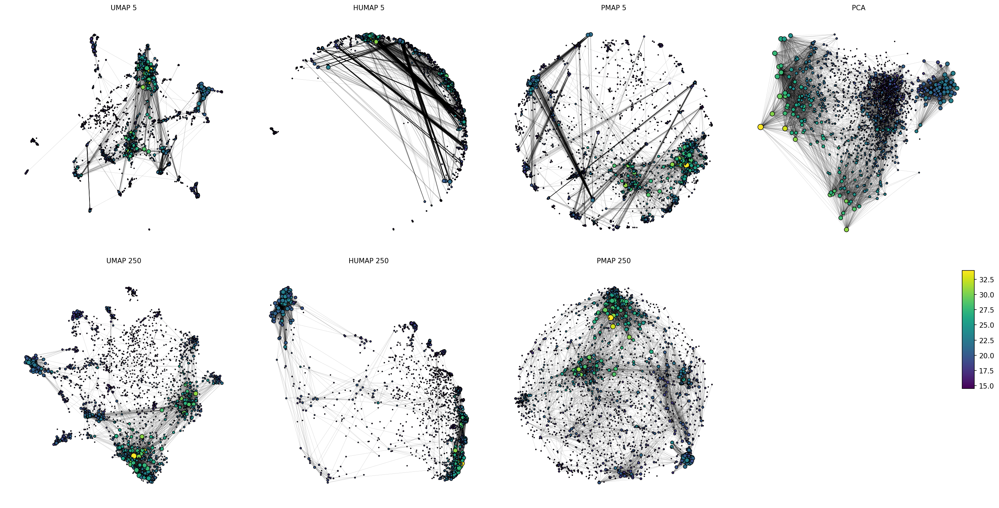

In [ ]:
embedding_dict = {}
for method_name in ["UMAP_5", "HUMAP_5", "PMAP_5", "PCA", "UMAP_250", "HUMAP_250", "PMAP_250"]:
    method = method_name.split("_")[0]
    if (method == "PCA") or (method == "FWD"):
        neighbors = 0
    else:
        neighbors = int(method_name.split("_")[1])
    embedding_dict[" ".join(method_name.split('_'))] = (subset_G, data[dataset_name][data_subset_name]["subset_embeddings"][method][2][neighbors])

plot_networks(embedding_dict, node_color=subset_weighted_degree,
              edge_stregth = 0.25, node_size_base = 1.5, node_size_degree_increment = 0.5,
              n_rows=2, n_cols=4, d1 = 5, d2 = 5.2, fontsize = 10,
              save_name = dataset_name + "_" + data_subset_name + "_subset_degree_2D.png")

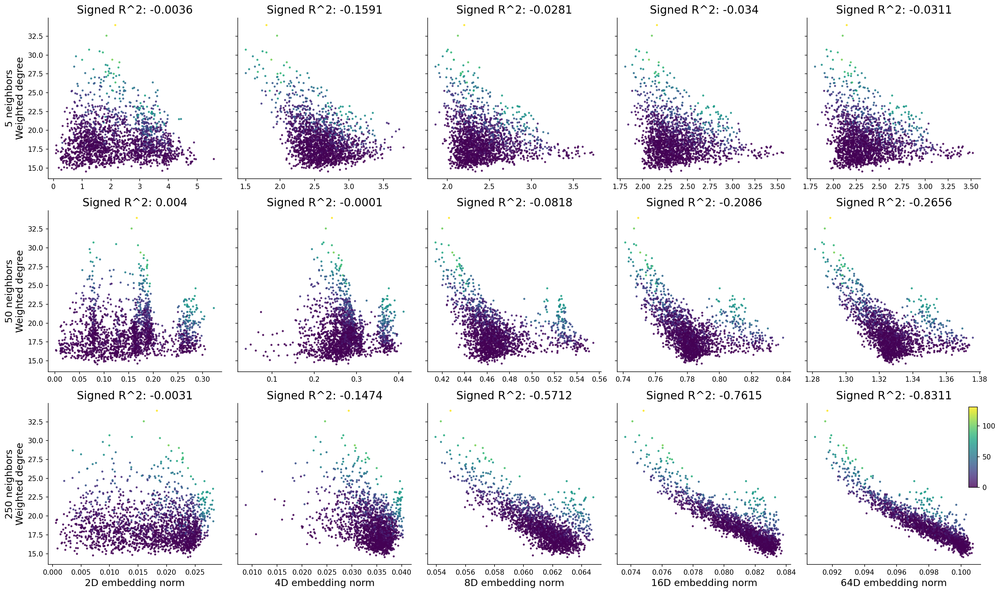

In [16]:
method = "PMAP"
dimensions = [2, 4, 8, 16, 64]
neighbors = [5, 50, 250]

plot_norm_to_degree(data[dataset_name][data_subset_name]["subset_embeddings"], weighted_degree = subset_weighted_degree, degree = subset_degree, translate = False,
                    method = method, dimensions = dimensions, neighbors = neighbors, d1 = 4.0, d2 = 4.0, fontsize = 12,
                    #title = method + " embedding norms plotted against weighted-degree, colored by degree",
                    save_name = dataset_name + "_" + data_subset_name + "_subset_" + method + "_norm_degree.png")

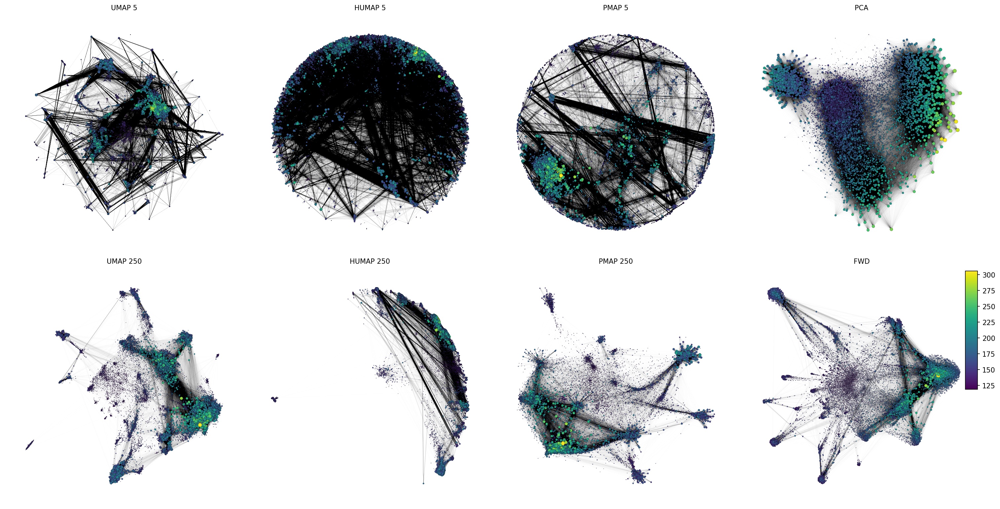

In [ ]:
embedding_dict = {}
for method_name in ["UMAP_5", "HUMAP_5", "PMAP_5", "PCA", "UMAP_250", "HUMAP_250", "PMAP_250", "FWD"]:
    method = method_name.split("_")[0]
    if (method == "PCA") or (method == "FWD"):
        neighbors = 0
    else:
        neighbors = int(method_name.split("_")[1])
    embedding_dict[" ".join(method_name.split('_'))] = (G, data[dataset_name][data_subset_name]["embeddings"][method][2][neighbors])

plot_networks(embedding_dict, node_color=weighted_degree,
              edge_stregth = 0.05, node_size_base = 0.25, node_size_degree_increment = 0.025,
              n_rows=2, n_cols=4, d1 = 5, d2 = 5.2, fontsize = 10,
              save_name = dataset_name + "_" + data_subset_name + "_degree_2D.png")

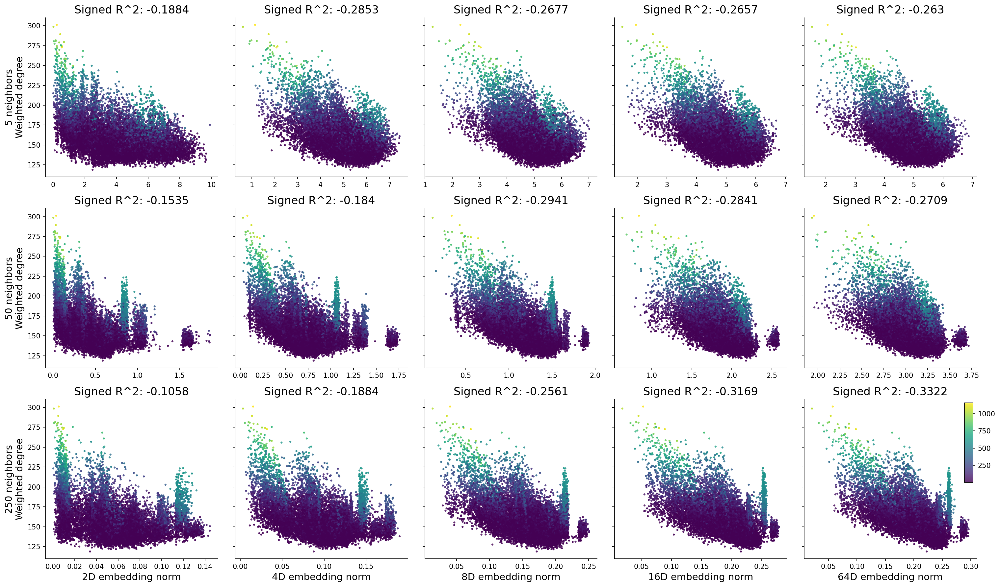

In [23]:
method = "PMAP"
dimensions = [2, 4, 8, 16, 64]
neighbors = [5, 50, 250]

plot_norm_to_degree(data[dataset_name][data_subset_name]["embeddings"], weighted_degree = weighted_degree, degree = degree, translate = True,
                    method = method, dimensions = dimensions, neighbors = neighbors, d1 = 4.0, d2 = 4.0, fontsize = 12,
                    #title = method + " embedding norms plotted against weighted-degree, colored by degree",
                    save_name = dataset_name + "_" + data_subset_name + "_" + method + "_norm_degree.png")

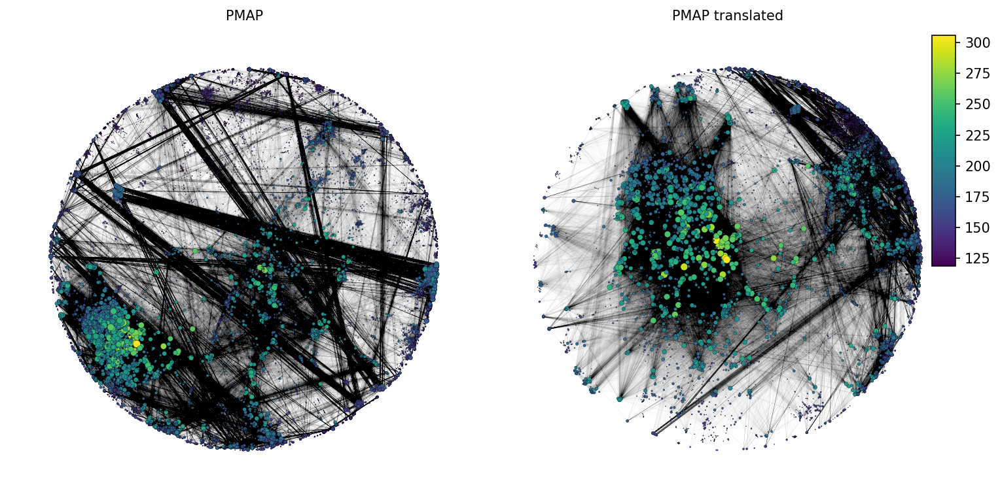

In [ ]:
embedding_dict = {}
embeddings = data[dataset_name][data_subset_name]["embeddings"]["PMAP"][2][5]
embedding_dict["PMAP"] = (G, embeddings)
center = embeddings[np.argmax(weighted_degree)]
embeddings = poincare_translation(-center, embeddings)
embedding_dict["PMAP translated"] = (G, embeddings)

plot_networks(embedding_dict, node_color=weighted_degree,
              edge_stregth = 0.05, node_size_base = 0.25, node_size_degree_increment = 0.025,
              n_rows=1, n_cols=2, d1 = 5, d2 = 5.2, fontsize = 10,
              save_name = dataset_name + "_" + data_subset_name + "_PMAP_translation_2D.png")